##INSTALACIÓN E IMPORTACIÓN DE LIBRERÍAS
---

In [ ]:
%%capture
!pip install dash
!pip install folium
!pip install geopandas
!pip install pygeos
!apt install gdal-bin python-gdal python3-gdal
!apt install python3-rtree
!pip install contextily

In [ ]:
%%capture
#estructura de datos y operaciones generales
import pandas as pd
import numpy as np
import statistics as stat
#visualización de datos
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import seaborn as sns
import plotly.express as px
from dash import Dash, dcc, html, Input, Output
import folium
import branca
#geo
import geopandas as gpd
from shapely import wkt
import rtree
import pygeos
import contextily as ctx
import requests

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pba = LinearSegmentedColormap.from_list('crea',['#00adc1ff','#e61c73ff'])

In [ ]:
amarillo = LinearSegmentedColormap.from_list('amarillo',['cornsilk', '#f8bf00ff'])

In [ ]:
cyan = LinearSegmentedColormap.from_list('cyan',['mintcream', '#00adc1ff'])

In [ ]:
magenta = LinearSegmentedColormap.from_list('magenta',['pink','#e61c73ff'])

##IMPORTACIÓN DE DATASETS
---

In [ ]:
# importación dataset departamentos
path_deptos_INDEC ='/content/drive/MyDrive/Hábitat/datos/bases geo/pais_x_dpto/pxdptodatosok.shp'
deptos_INDEC = gpd.read_file(path_deptos_INDEC)


In [ ]:
# importación datos ICM SIEMPRO
path_ICM = '/content/drive/MyDrive/Hábitat/datos/icm x muni.xlsx'
ICM = pd.read_excel(path_ICM)

In [ ]:
# importación dataset establecimientos educativos
path_establecimientos_educativos ='/content/drive/MyDrive/Hábitat/MDC/01. UNIDAD MINISTRO/mapa de vulnerabilidad social/BBDD/establecimientos-educativos-180620242.geojson'
establecimientos_educativos = gpd.read_file(path_establecimientos_educativos)

In [ ]:
# importación dataset SAE y MESA
path_SAE_comedor ='/content/drive/MyDrive/Hábitat/MDC/01. UNIDAD MINISTRO/mapa de vulnerabilidad social/BBDD/ABRIL_2024_COMEDOR.xlsx'
SAE_comedor = pd.read_excel(path_SAE_comedor)
path_SAE_dm ='/content/drive/MyDrive/Hábitat/MDC/01. UNIDAD MINISTRO/mapa de vulnerabilidad social/BBDD/ABRIL_2024_DM.xlsx'
SAE_dm = pd.read_excel(path_SAE_comedor)

# MAPAS BASE
---

In [ ]:
deptos_INDEC.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 527 entries, 0 to 526
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   link        527 non-null    object  
 1   codpcia     527 non-null    object  
 2   departamen  527 non-null    object  
 3   provincia   527 non-null    object  
 4   mujeres     527 non-null    object  
 5   varones     527 non-null    object  
 6   personas    527 non-null    object  
 7   hogares     527 non-null    object  
 8   viv_part    527 non-null    object  
 9   viv_part_h  527 non-null    object  
 10  geometry    527 non-null    geometry
dtypes: geometry(1), object(10)
memory usage: 45.4+ KB


In [ ]:
deptos_INDEC.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

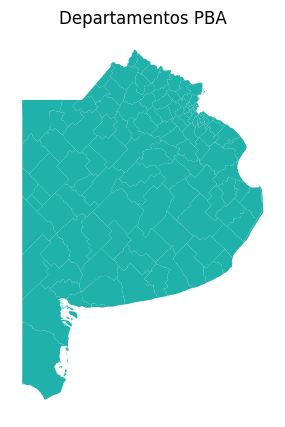

In [ ]:
#filtro PBA
deptos_PBA=deptos_INDEC.loc[(deptos_INDEC.provincia == 'Buenos Aires')].reset_index(drop=True)
deptos_PBA.rename(columns={"departamen": "Municipio"}, inplace=True,)

# impresión mapa
fig, ax = plt.subplots(figsize=(7, 5))
ax.set_title('Departamentos PBA', size=12)
deptos_PBA.plot(color='lightseagreen', ax=ax)
ax.axis('off')
plt.show()

In [ ]:
deptos_PBA['centroide']=deptos_PBA['geometry'].centroid
deptos_PBA['centroide'] = wkt.dumps(deptos_PBA['centroide'])
deptos_PBA['lat'] = deptos_PBA['centroide'].apply(lambda x : x[28:48]).astype('float64')
deptos_PBA['lon'] = deptos_PBA['centroide'].apply(lambda x : x[7:27]).astype('float64')
deptos_PBA.drop(['link','codpcia','provincia'], axis=1, inplace=True)

<ipython-input-136-8b534b66f41f>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  deptos_PBA['centroide']=deptos_PBA['geometry'].centroid


In [ ]:
deptos_PBA.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
#deptos_PBA = deptos_PBA.to_crs(3857)
#deptos_PBA.crs

In [ ]:
RMBA = ['Almirante Brown', 'Avellaneda', 'Berazategui', 'Berisso', 'Brandsen', 'Campana', 'Cañuelas', 'Ensenada', 'Escobar', 'Esteban Echeverría',
             'Exaltación de la Cruz','Ezeiza','Florencio Varela', 'General Las Heras','General Rodríguez', 'General San Martín', 'Hurlingham', 'Ituzaingó', 'José C. Paz',
             'La Matanza', 'Lanús', 'La Plata', 'Lomas de Zamora', 'Luján','Malvinas Argentinas', 'Marcos Paz', 'Merlo', 'Moreno', 'Morón', 'Pilar',
             'Presidente Perón','Quilmes', 'San Fernando', 'San Isidro', 'San Miguel', 'San Vicente', 'Tigre', 'Tres de Febrero', 'Vicente López', 'Zárate']
len(RMBA)


40

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:658: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


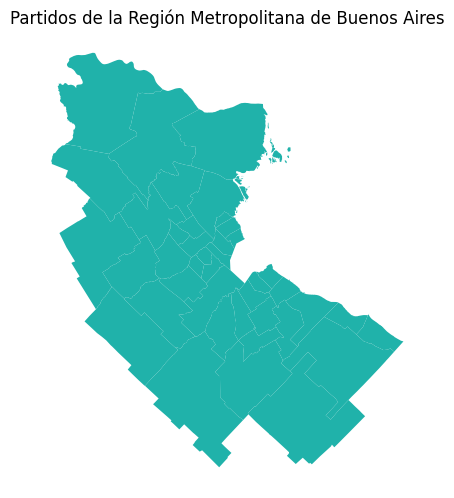

In [ ]:
# filtro RMBA
deptos_PBA['region'] = deptos_PBA['Municipio'].apply(lambda x:'RMBA' if x in RMBA else 'Interior')
partidos_RMBA=deptos_PBA.loc[(deptos_PBA.region == 'RMBA')].reset_index(drop=True)
# impresión mapa
fig, ax = plt.subplots(figsize=(5, 7))
ax.set_title('Partidos de la Región Metropolitana de Buenos Aires', size=12)
partidos_RMBA.plot('geometry', color='lightseagreen', ax=ax)
ax.axis('off')
plt.show()

/usr/local/lib/python3.10/dist-packages/geopandas/plotting.py:658: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


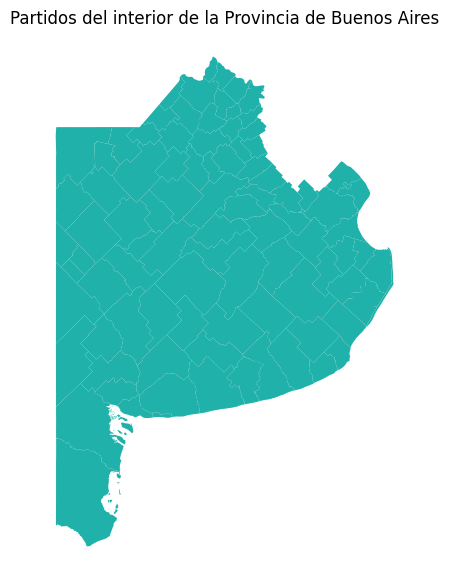

In [ ]:
# filtro INTERIOR
partidos_interior=deptos_PBA.loc[(deptos_PBA.region == 'Interior')].reset_index(drop=True)
# impresión mapa
fig, ax = plt.subplots(figsize=(5, 7))
ax.set_title('Partidos del interior de la Provincia de Buenos Aires', size=12)
partidos_interior.plot('geometry', color='lightseagreen', ax=ax)
ax.axis('off')
plt.show()

In [ ]:
puntos_municipios = deptos_PBA.loc[:, ['Municipio','region','lat','lon']]

In [ ]:
puntos_municipios

,Municipio,region,lat,lon
0,Berazategui,RMBA,-34.818953,-58.155343
1,Carlos Casares,Interior,-35.751284,-61.374634
2,Carlos Tejedor,Interior,-35.382788,-62.430030
3,Carmen de Areco,Interior,-34.408467,-59.885156
4,Castelli,Interior,-36.044809,-57.653054
...,...,...,...,...
129,25 de Mayo,Interior,-35.528403,-60.229803
130,Vicente López,RMBA,-34.527886,-58.505063
131,Villa Gesell,Interior,-37.365371,-57.059289
132,Villarino,Interior,-39.131312,-62.713480


In [ ]:
partidos_RMBA.Municipio.count()

40

In [ ]:
deptos_PBA.Municipio.count()

134

In [ ]:
print(sorted(ICM.Municipio.unique()))

['25 de Mayo', '9 de Julio', 'Adolfo Alsina', 'Adolfo Gonzales Chaves', 'Alberti', 'Almirante Brown', 'Arrecifes', 'Avellaneda', 'Ayacucho', 'Azul', 'Bahía Blanca', 'Balcarce', 'Baradero', 'Benito Juárez', 'Berazategui', 'Berisso', 'Bolívar', 'Bragado', 'Brandsen', 'Campana', 'Capitán Sarmiento', 'Carlos Casares', 'Carlos Tejedor', 'Carmen de Areco', 'Castelli', 'Cañuelas', 'Chacabuco', 'Chascomús', 'Chivilcoy', 'Colón', 'Coronel Dorrego', 'Coronel Pringles', 'Coronel Suárez', 'Coronel de Marina Leonardo Rosales', 'Daireaux', 'Dolores', 'Ensenada', 'Escobar', 'Esteban Echeverría', 'Exaltación de la Cruz', 'Ezeiza', 'Florencio Varela', 'Florentino Ameghino', 'General Alvarado', 'General Alvear', 'General Arenales', 'General Belgrano', 'General Guido', 'General Juan Madariaga', 'General La Madrid', 'General Las Heras', 'General Lavalle', 'General Paz', 'General Pinto', 'General Pueyrredón', 'General Rodríguez', 'General San Martín', 'General Viamonte', 'General Villegas', 'Guaminí', 'Hip

In [ ]:
print(sorted(deptos_PBA.Municipio.unique()))

['25 de Mayo', '9 de Julio', 'Adolfo Alsina', 'Adolfo Gonzales Chaves', 'Alberti', 'Almirante Brown', 'Arrecifes', 'Avellaneda', 'Ayacucho', 'Azul', 'Bahía Blanca', 'Balcarce', 'Baradero', 'Benito Juárez', 'Berazategui', 'Berisso', 'Bolívar', 'Bragado', 'Brandsen', 'Campana', 'Capitán Sarmiento', 'Carlos Casares', 'Carlos Tejedor', 'Carmen de Areco', 'Castelli', 'Cañuelas', 'Chacabuco', 'Chascomús', 'Chivilcoy', 'Colón', 'Coronel Dorrego', 'Coronel Pringles', 'Coronel Suárez', 'Coronel de Marina Leonardo Rosales', 'Daireaux', 'Dolores', 'Ensenada', 'Escobar', 'Esteban Echeverría', 'Exaltación de la Cruz', 'Ezeiza', 'Florencio Varela', 'Florentino Ameghino', 'General Alvarado', 'General Alvear', 'General Arenales', 'General Belgrano', 'General Guido', 'General Juan Madariaga', 'General La Madrid', 'General Las Heras', 'General Lavalle', 'General Paz', 'General Pinto', 'General Pueyrredón', 'General Rodríguez', 'General San Martín', 'General Viamonte', 'General Villegas', 'Guaminí', 'Hip

In [ ]:
print(sorted(partidos_RMBA.Municipio.unique()))

['Almirante Brown', 'Avellaneda', 'Berazategui', 'Berisso', 'Brandsen', 'Campana', 'Cañuelas', 'Ensenada', 'Escobar', 'Esteban Echeverría', 'Exaltación de la Cruz', 'Ezeiza', 'Florencio Varela', 'General Las Heras', 'General Rodríguez', 'General San Martín', 'Hurlingham', 'Ituzaingó', 'José C. Paz', 'La Matanza', 'La Plata', 'Lanús', 'Lomas de Zamora', 'Luján', 'Malvinas Argentinas', 'Marcos Paz', 'Merlo', 'Moreno', 'Morón', 'Pilar', 'Presidente Perón', 'Quilmes', 'San Fernando', 'San Isidro', 'San Miguel', 'San Vicente', 'Tigre', 'Tres de Febrero', 'Vicente López', 'Zárate']


# ICM
---

In [ ]:
ICM_PBA =pd.merge(deptos_PBA, ICM, how = 'left', on = 'Municipio')

In [ ]:
ICM_RMBA =pd.merge(partidos_RMBA, ICM, how = 'left', on = 'Municipio')

In [ ]:
ICM_PBA.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Municipio   134 non-null    object  
 1   mujeres     134 non-null    object  
 2   varones     134 non-null    object  
 3   personas    134 non-null    object  
 4   hogares     134 non-null    object  
 5   viv_part    134 non-null    object  
 6   viv_part_h  134 non-null    object  
 7   geometry    134 non-null    geometry
 8   centroide   134 non-null    object  
 9   lat         134 non-null    float64 
 10  lon         134 non-null    float64 
 11  region      134 non-null    object  
 12  ICM         134 non-null    int64   
dtypes: float64(2), geometry(1), int64(1), object(9)
memory usage: 13.7+ KB


In [ ]:
ICM_PBA[["mujeres","varones", "personas", "hogares", "viv_part", "viv_part_h"]]= ICM_PBA[["mujeres","varones", "personas", "hogares", "viv_part", "viv_part_h"]].apply(pd.to_numeric)

In [ ]:
ICM_PBA.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Municipio   134 non-null    object  
 1   mujeres     134 non-null    int64   
 2   varones     134 non-null    int64   
 3   personas    134 non-null    int64   
 4   hogares     134 non-null    int64   
 5   viv_part    134 non-null    int64   
 6   viv_part_h  134 non-null    int64   
 7   geometry    134 non-null    geometry
 8   centroide   134 non-null    object  
 9   lat         134 non-null    float64 
 10  lon         134 non-null    float64 
 11  region      134 non-null    object  
 12  ICM         134 non-null    int64   
dtypes: float64(2), geometry(1), int64(7), object(3)
memory usage: 13.7+ KB


In [ ]:
m = folium.Map(location=[-37, -58], zoom_start=6.5)

folium.Choropleth(
    geo_data=ICM_PBA.geometry,
    data=ICM_PBA.ICM,
    columns=["Municipio", "ICM"],
    fill_color="PuRd",
    key_on="feature.id"
).add_to(m)

m

In [ ]:
m = folium.Map(location=[-37, -58], zoom_start=6.5)
colormap = branca.colormap.LinearColormap(
    vmin=ICM_PBA["ICM"].quantile(0.0),
    vmax=ICM_PBA["ICM"].quantile(1),
    colors=['darkcyan','deeppink'],
    caption="Índice de Carencias Múltiples (Decil)").add_to(m)

ICM = folium.GeoJson(
      ICM_PBA,
      name="Datos Sociodemográficos",
      style_function=lambda x: {"fillColor": colormap(x["properties"]["ICM"])
        if x["properties"]["ICM"] is not None
        else "transparent",
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.8},
      popup=folium.GeoJsonPopup(
           fields=["Municipio", "personas", "hogares", "viv_part_h", "ICM"],
           aliases=["Municipio","Población", "Hogares", "Viviendas", "ICM"],
           localize=True,
           sticky=False,
           labels=True),
      tooltip=folium.GeoJsonTooltip(
           fields=["Municipio","personas", "hogares", "viv_part_h", "ICM"],
           aliases=["Municipio","Población", "Hogares", "Viviendas", "ICM"],
           localize=True,
           sticky=False,
           labels=True),
      highlight_function=lambda x: {"fillOpacity": 1},
      zoom_on_click=False).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m

# SAE Y MESA
---

In [172]:
establecimientos_educativos.columns

Index(['row_number', 'idserv', 'clave', 'cueanexo', 'nombre', 'id_modalid',
       'modalidad', 'id_nivel', 'nivel', 'id_periodo', 'periodo', 'calle',
       'nro', 'calle_late', 'calle_lat0', 'id_localid', 'localidad',
       'codigo_pos', 'id_distrit', 'distrito', 'region', 'region_edu',
       'categoria', 'depend_fun', 'caracteris', 'nro_telefo', 'rpv', 'email',
       'desfavorab', 'subvencion', 'id_ubicaci', 'ubicacion', 'id_sector',
       'sector', 'id_depende', 'dependenci', 'id_tipo_or', 'tipo_organ',
       'matricula', 'varones', 'mujeres', 'secciones', 'turnos', 'capa',
       'area', 'seccion_el', 'sede_axo_e', 'esc_sede', 'cue', 'anexo',
       'nro_escuel', 'latitud', 'longitud', 'cui', 'geometry'],
      dtype='object')

In [ ]:
establecimientos_educativos.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
geo_establecimientos=establecimientos_educativos.loc[:,['cueanexo', 'latitud','longitud', 'geometry']]
geo_establecimientos.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 21622 entries, 0 to 21621
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   cueanexo  21622 non-null  object  
 1   latitud   21622 non-null  float64 
 2   longitud  21622 non-null  float64 
 3   geometry  21622 non-null  geometry
dtypes: float64(2), geometry(1), object(1)
memory usage: 675.8+ KB


In [ ]:
geo_establecimientos.cueanexo = geo_establecimientos.cueanexo.astype('int64')
geo_establecimientos.drop_duplicates(inplace=True)
geo_establecimientos.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 19755 entries, 0 to 21621
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   cueanexo  19755 non-null  int64   
 1   latitud   19755 non-null  float64 
 2   longitud  19755 non-null  float64 
 3   geometry  19755 non-null  geometry
dtypes: float64(2), geometry(1), int64(1)
memory usage: 771.7 KB


In [ ]:
SAE_comedor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5013 entries, 0 to 5012
Data columns (total 9 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   REGIÓN                                  5013 non-null   int64  
 1   DISTRITO                                5013 non-null   object 
 2   CUE                                     4974 non-null   object 
 3   ESTABLECIMIENTO                         5013 non-null   object 
 4   NIVEL                                   5013 non-null   object 
 5   PRESTACIONES DE COMEDOR EJECUTADAS      5012 non-null   float64
 6   PRESTACIONES DE COMEDOR LC EJECUTADAS   5012 non-null   float64
 7   CUPOS COMEDOR EJECUTADOS                5013 non-null   float64
 8   CUPOS COMEDOR LC EJECUTADOS             5013 non-null   int64  
dtypes: float64(3), int64(2), object(4)
memory usage: 352.6+ KB


In [ ]:
SAE_comedor.dropna(inplace=True)

In [ ]:
SAE_comedor.CUE=SAE_comedor.CUE.astype('int64')
SAE_comedor.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4972 entries, 0 to 5012
Data columns (total 9 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   REGIÓN                                  4972 non-null   int64  
 1   DISTRITO                                4972 non-null   object 
 2   CUE                                     4972 non-null   int64  
 3   ESTABLECIMIENTO                         4972 non-null   object 
 4   NIVEL                                   4972 non-null   object 
 5   PRESTACIONES DE COMEDOR EJECUTADAS      4972 non-null   float64
 6   PRESTACIONES DE COMEDOR LC EJECUTADAS   4972 non-null   float64
 7   CUPOS COMEDOR EJECUTADOS                4972 non-null   float64
 8   CUPOS COMEDOR LC EJECUTADOS             4972 non-null   int64  
dtypes: float64(3), int64(3), object(3)
memory usage: 388.4+ KB


In [ ]:
SAE_geo = pd.merge(geo_establecimientos, SAE_comedor, how='left',left_on= 'cueanexo', right_on='CUE')
SAE_geo.dropna(inplace=True)

In [ ]:
SAE_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3143 entries, 329 to 19734
Data columns (total 13 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   cueanexo                                3143 non-null   int64   
 1   latitud                                 3143 non-null   float64 
 2   longitud                                3143 non-null   float64 
 3   geometry                                3143 non-null   geometry
 4   REGIÓN                                  3143 non-null   float64 
 5   DISTRITO                                3143 non-null   object  
 6   CUE                                     3143 non-null   float64 
 7   ESTABLECIMIENTO                         3143 non-null   object  
 8   NIVEL                                   3143 non-null   object  
 9   PRESTACIONES DE COMEDOR EJECUTADAS      3143 non-null   float64 
 10  PRESTACIONES DE COMEDOR LC EJECUTADAS   31

In [ ]:
SAE_geo.NIVEL.unique()

array(['ESPECIAL', 'INICIAL', 'SECUNDARIA', 'PRIMARIA', 'PSICOLOGÍA',
       'Inicial'], dtype=object)

In [175]:
m = folium.Map(location=[-37, -58], tiles='cartodbpositron', zoom_start=6.5)


colormap = branca.colormap.LinearColormap(
    vmin=ICM_PBA["ICM"].quantile(0.0),
    vmax=ICM_PBA["ICM"].quantile(1),
    colors=['darkcyan','deeppink'],
    caption="Índice de Carencias Múltiples (Decil)").add_to(m)

ICM = folium.GeoJson(ICM_PBA, name="Datos Sociodemográficos",
      style_function=lambda x: {"fillColor": colormap(x["properties"]["ICM"])
        if x["properties"]["ICM"] is not None
        else "transparent",
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.8},
      tooltip=folium.GeoJsonTooltip(
           fields=["Municipio","personas", "hogares", "viv_part_h", "ICM"],
           aliases=["Municipio","Población", "Hogares", "Viviendas", "ICM"]),
      popup=folium.GeoJsonPopup(
           fields=["Municipio","personas", "hogares", "viv_part_h", "ICM"],
           aliases=["Municipio","Población", "Hogares", "Viviendas", "ICM"]),
      highlight_function=lambda x: {"fillOpacity": 1},
      zoom_on_click=False).add_to(m)

SAE = folium.GeoJson(SAE_geo,name="Sistema Alimentario Escolar",
      marker=folium.Circle(radius=4, fill_color="darkcyan", fill_opacity=0.4, color="black", weight=1),
      tooltip=folium.GeoJsonTooltip(fields=["DISTRITO", "ESTABLECIMIENTO", "NIVEL", "CUPOS COMEDOR EJECUTADOS"],
                                    aliases=["Municipio", "Establecimiento", "Nivel", "Cupos"]),
      popup=folium.GeoJsonPopup(fields=["DISTRITO", "ESTABLECIMIENTO", "NIVEL", "CUPOS COMEDOR EJECUTADOS"],
                                    aliases=["Municipio", "Establecimiento", "Nivel", "Cupos"]),
      style_function=lambda x: {"radius": (x['properties']['CUPOS COMEDOR EJECUTADOS'])/2},
    highlight_function=lambda x: {"fillOpacity": 0.8},
    zoom_on_click=False).add_to(m)
#colors = ["deeppink", "darkcyan", "yellow", "gray", "black"]
#"fillColor": colors[x['properties']['NIVEL']]
#marker=folium.Marker(icon=folium.Icon(icon='star'))


folium.LayerControl(collapsed=False).add_to(m)

#m.save("mapaSAE.htlm")

m